In [15]:
import pathlib

import numpy as np
import torch
from PIL import Image, ImageOps
from transformers import TrOCRProcessor, VisionEncoderDecoderModel
from ultralytics import YOLO

In [16]:
def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


seed_everything(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [17]:
class TextRecognizePipeline:
    def __init__(self, detection_model_path: str, ocr_model_dir_path: str):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.ocr_processor = TrOCRProcessor.from_pretrained("raxtemur/trocr-base-ru")
        self.ocr_model = VisionEncoderDecoderModel.from_pretrained(
            ocr_model_dir_path, local_files_only=True
        ).to(self.device)
        self.detection_model = YOLO(detection_model_path).to(self.device)

        # Set special tokens used for creating the decoder_input_ids from the labels.
        self.ocr_model.config.decoder_start_token_id = (
            self.ocr_processor.tokenizer.cls_token_id
        )
        self.ocr_model.config.pad_token_id = self.ocr_processor.tokenizer.pad_token_id
        # Set Correct vocab size.
        self.ocr_model.config.vocab_size = self.ocr_model.config.decoder.vocab_size
        self.ocr_model.config.eos_token_id = self.ocr_processor.tokenizer.sep_token_id

        self.ocr_model.config.max_length = 64
        self.ocr_model.config.early_stopping = True
        self.ocr_model.config.no_repeat_ngram_size = 3
        self.ocr_model.config.length_penalty = 2.0
        self.ocr_model.config.num_beams = 4

    def detect_text_and_crop_images(self, img: Image) -> list[Image]:
        def sort_bbox_by_y(bbox_list):
            sorted_bbox = sorted(
                bbox_list, key=lambda bbox: (bbox[0], bbox[1])
            )  # Сортировка по координате y, затем по x
            return sorted_bbox

        result = []
        for predict, image in zip(self.detection_model.predict([img]), [img]):
            bboxes = (
                predict.boxes.xyxy.cpu().tolist()
            )  # поменять на сегментационную маску
            sorted_bboxes = sort_bbox_by_y(bboxes)
            for box in sorted_bboxes:
                cropped_image = image.crop(box)
                result.append(cropped_image)
        return result

    def get_ocr_predictions(self, img_list: list[Image]) -> list[str]:
        pixel_values = self.ocr_processor(
            img_list, return_tensors="pt"
        ).pixel_values.to(device)
        generated_ids = self.ocr_model.generate(pixel_values)
        generated_text = self.ocr_processor.batch_decode(
            generated_ids, skip_special_tokens=True
        )
        return generated_text

    def recognize(self, img: Image) -> list[str]:
        cropped_images = self.detect_text_and_crop_images(img)
        recognized_text = self.get_ocr_predictions(cropped_images)
        return recognized_text

In [18]:
def get_rand_image():
    # path = pathlib.Path("../../data/processed/3 Production/text_detector/test/images")
    path = pathlib.Path("/home/vadim/work/HTR-historical/data/processed/test")

    img_path = np.random.choice(list(path.iterdir()))
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img)
    return img, img_path

Инициализируем пайплайн

In [19]:
detection_model_path = "../../models/detector/best.pt"
ocr_model_dir_path = "../../models/recognizer/trocr_ru_pretrain_3epoch"

ocr_pipeline = TextRecognizePipeline(
    detection_model_path=detection_model_path, ocr_model_dir_path=ocr_model_dir_path
)

/home/vadim/work/HTR-historical/.venv/lib/python3.10/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/home/vadim/work/HTR-historical/.venv/lib/python3.10/site-packages/ultralytics/nn/tasks.py:708: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explici

Получаем и отображаем случайное изображение из директории


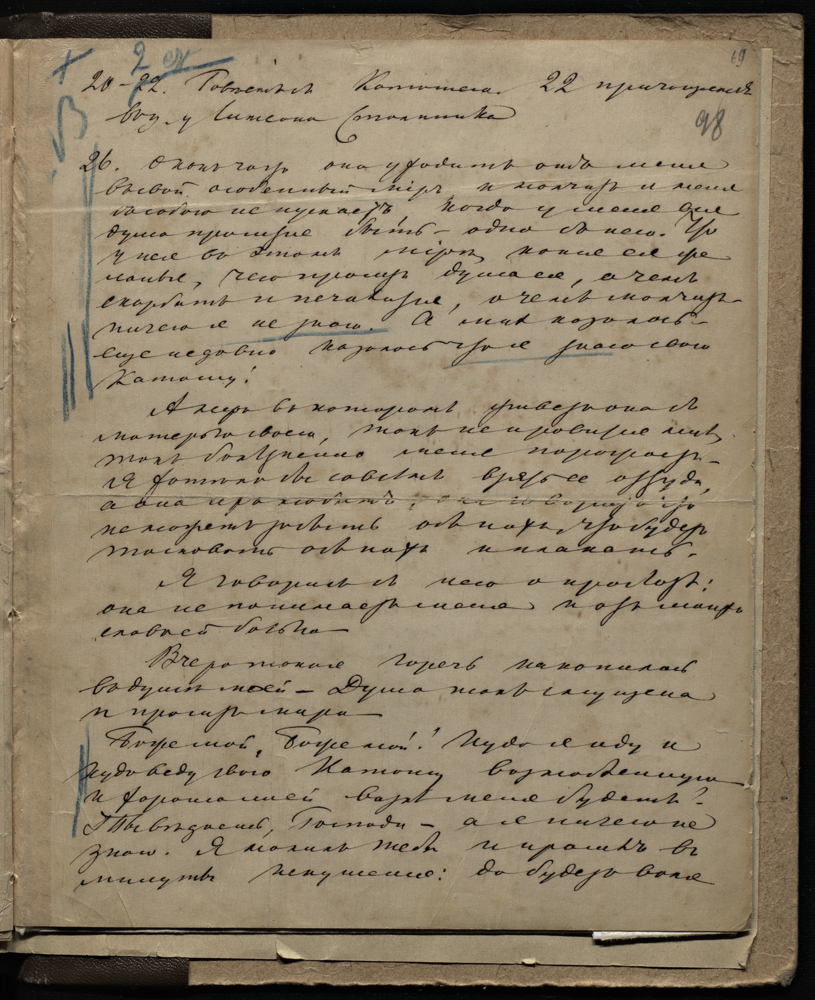

In [20]:
img, img_path = get_rand_image()
img

Из пайплайна можем получить список задетектированных строк и отобразить их

In [21]:
res = ocr_pipeline.detection_model.predict([img])


0: 640x544 47 texts, 3.3ms
Speed: 1.8ms preprocess, 3.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 544)


In [25]:
out = res[0].plot()

In [28]:
im_bgr = res[0].plot()  # BGR-order numpy array
im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image

# Show results to screen (in supported environments)
res[0].show()

# Save results to disk
res[0].save(filename=f"results{i}.jpg")

NameError: name 'i' is not defined

Error: no "view" rule for type "image/png" passed its test case
       (for more information, add "--debug=1" on the command line)
Loading "original-fs" failed
Error: Cannot find module 'original-fs'
Require stack:
- /home/vadim/.vscode-server/cli/servers/Stable-b1c0a14de1414fcdaa400695b4db1c0799bc3124/server/out/server-cli.js
    at Module._resolveFilename (node:internal/modules/cjs/loader:1145:15)
    at Module._load (node:internal/modules/cjs/loader:986:27)
    at Module.require (node:internal/modules/cjs/loader:1233:19)
    at require (node:internal/modules/helpers:179:18)
    at i (/home/vadim/.vscode-server/cli/servers/Stable-b1c0a14de1414fcdaa400695b4db1c0799bc3124/server/out/server-cli.js:3:98)
    at r.load (/home/vadim/.vscode-server/cli/servers/Stable-b1c0a14de1414fcdaa400695b4db1c0799bc3124/server/out/server-cli.js:2:1637)
    at h.load (/home/vadim/.vscode-server/cli/servers/Stable-b1c0a14de1414fcdaa400695b4db1c0799bc3124/server/out/server-cli.js:1:13958)
    at u (/home/v

In [14]:
cropped_images = ocr_pipeline.detect_text_and_crop_images(img)

0: 640x416 (no detections), 32.5ms
Speed: 2.8ms preprocess, 32.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 416)


In [ ]:
ocr_pipeline.

In [ ]:
for cropped_image in cropped_images:
    display(cropped_image)

Получаем распознанный текст с изображения

In [10]:
recognized_text = ocr_pipeline.recognize(img)


0: 512x448 32 texts, 18.2ms
Speed: 18.0ms preprocess, 18.2ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 448)


In [11]:
ocr_pipeline.get_ocr_predictions(cropped_images)

['количественныхъ',
 'по стороне особенныхъ',
 'зной. Я носиль тебя и проихъ въ',
 'минуты ракушенiю: до будетъ воля',
 'Худовску гвого Котонц возновенную',
 'въ душе моей – Дума толь снуждена',
 'и коротошей возпеченiя будетъ.',
 'Тыведомъ, Госпову – ая ничего не',
 'толковомъ отвинуть и планенъ,',
 'той болученно меня порожар',
 'еще недовно козолось уже расо свои',
 'ненадцать робыть объ нихъ у',
 'Катошу,',
 'же не поминаетъ меня козьмоих',
 'скорбитъ и печатаня, о чень мончизъ',
 'словией больно',
 'ничего я не рого. а так козькось',
 'я дотекъ бы собства время озруж',
 'лонья, чего пролуг бушаея, а сенъ',
 'Бежемовъ, Боженiй. Пудоходу и',
 'Ту у Синсона (политика',
 'душа произвесть -одно съ каго. Ур',
 'въ собою не пускаетъ, кого умеля же',
 'околочку, она удовить отъ менее',
 'Вчеротское Горечь накопилась',
 'Андр въ которомъ утвержаетъ',
 'на про новыхъ, а словари',
 'яговорить съ чего о произв',
 'ты рекушенiя: до будер в',
 'особенный меръ, и нокчарь и',
 'въ этомъ мере, кок